<a href="https://colab.research.google.com/github/AkashBhardwaj9078/Demo_git_work/blob/main/malaria_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, InputLayer, BatchNormalization, Input, Dropout, RandomFlip, RandomRotation, Resizing, Rescaling
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import BinaryAccuracy, FalsePositives, FalseNegatives, TruePositives, TrueNegatives, Precision, Recall, AUC, binary_accuracy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback, CSVLogger, EarlyStopping, LearningRateScheduler, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers  import L2, L1
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import tensorflow_probability as tfp

In [ ]:
ds=tfds.load(
    'malaria',
    as_supervised=True,
    split=['train'],

    shuffle_files=True,
    batch_size=64,

)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/27558 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/malaria/incomplete.RJ016S_1.0.0/malaria-train.tfrecord*...:   0%|         …

Dataset malaria downloaded and prepared to /root/tensorflow_datasets/malaria/1.0.0. Subsequent calls will reuse this data.


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [ ]:
ds_train=image_dataset_from_directory(
    "/content/drive/MyDrive/imgdata/Dataset/Train",
    batch_size=32,
    image_size=(256,256),
    label_mode="categorical",
    shuffle=True,
    seed=43
)


ds_test=image_dataset_from_directory(
    "/content/drive/MyDrive/imgdata/Dataset/Test",
    batch_size=32,
    image_size=(256,256),
    label_mode="categorical",
    shuffle=True,
    seed=43
)





Found 416 files belonging to 2 classes.
Found 134 files belonging to 2 classes.


In [ ]:
ds_train.map(mixup)

TypeError: in user code:

    File "<ipython-input-105-9ac07ad1db83>", line 13, in mixup  *
        data_b = data[tf.random.uniform(shape=(batch_size,), minval=0, maxval=len(data), dtype=tf.int32)]

    TypeError: Only integers, slices (`:`), ellipsis (`...`), tf.newaxis (`None`) and scalar tf.int32/tf.int64 tensors are valid indices, got <tf.Tensor 'random_uniform_1:0' shape=(32,) dtype=int32>


In [ ]:
def preprocess(img,label):
  img=tf.image.resize(img,(256,256))
  img_data=img
  img_data=tf.image.resize(img_data,(256,256))
  img_data=tf.image.adjust_brightness(img_data,0.4)
  img_data=tf.image.adjust_contrast(img_data,0.4)
  img_data=tf.image.adjust_hue(img_data,0.4)

  return tf.cast(img,tf.float32)/255,label

In [ ]:
def mixup(x,y):
  (img1,lab1),(img1,lab1)=x,y
  lam=tfp.distributions.Beta(0.3,0.3).sample(1)[0]
  img=img1*lam+(1-lam)*img2
  lab=lam*lab1+(1-lam)*lab2
  return img,lab


In [ ]:
train_dataset1=ds_train.map(preprocess,num_parallel_calls=tf.data.AUTOTUNE)
train_dataset2=ds_train.map(preprocess,num_parallel_calls=tf.data.AUTOTUNE)
train_data=tf.data.Dataset.zip((train_dataset1,train_dataset2))
train_data=train_data.map(mixup,num_parallel_calls=tf.data.AUTOTUNE)
train_data

TypeError: in user code:

    File "<ipython-input-98-c65f46b3f1e6>", line 4, in mixup  *
        img=img1*lam+(1-lam)*img2

    TypeError: Expected float32 passed to parameter 'y' of op 'Mul', got <_MapDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))> of type '_MapDataset' instead. Error: Expected float32, but got <_MapDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))> of type '_MapDataset'.


In [ ]:
ds_sampl1=ds_train.shuffle(1024).map(preprocess,num_parallel_calls=tf.data.AUTOTUNE)
ds_sampl2=ds_train.shuffle(1024).map(preprocess,num_parallel_calls=tf.data.AUTOTUNE)
ds_data=tf.data.Dataset.zip((ds_sampl1,ds_sampl2))
ds_data=ds_data.map(mixup,num_parallel_calls=tf.data.AUTOTUNE)


TypeError: in user code:

    File "<ipython-input-98-c65f46b3f1e6>", line 4, in mixup  *
        img=img1*lam+(1-lam)*img2

    TypeError: Expected float32 passed to parameter 'y' of op 'Mul', got <_MapDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))> of type '_MapDataset' instead. Error: Expected float32, but got <_MapDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))> of type '_MapDataset'.


In [ ]:
def split(ds,train_ratio,val_ratio):
  n=len(ds)
  ds_train=ds.take(int(n*train_ratio))
  ds_val=ds.skip(len(ds_train)).take(int(n*(val_ratio)))
  return ds_train,ds_val


In [ ]:
ds_train,ds_val=split(ds_train,0.6,0.4)

In [ ]:
print(len(ds_train),len(ds_test),len(ds_val))

7 5 5


In [ ]:
import tensorflow as tf

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
classes=["Parasite","Unifected"]

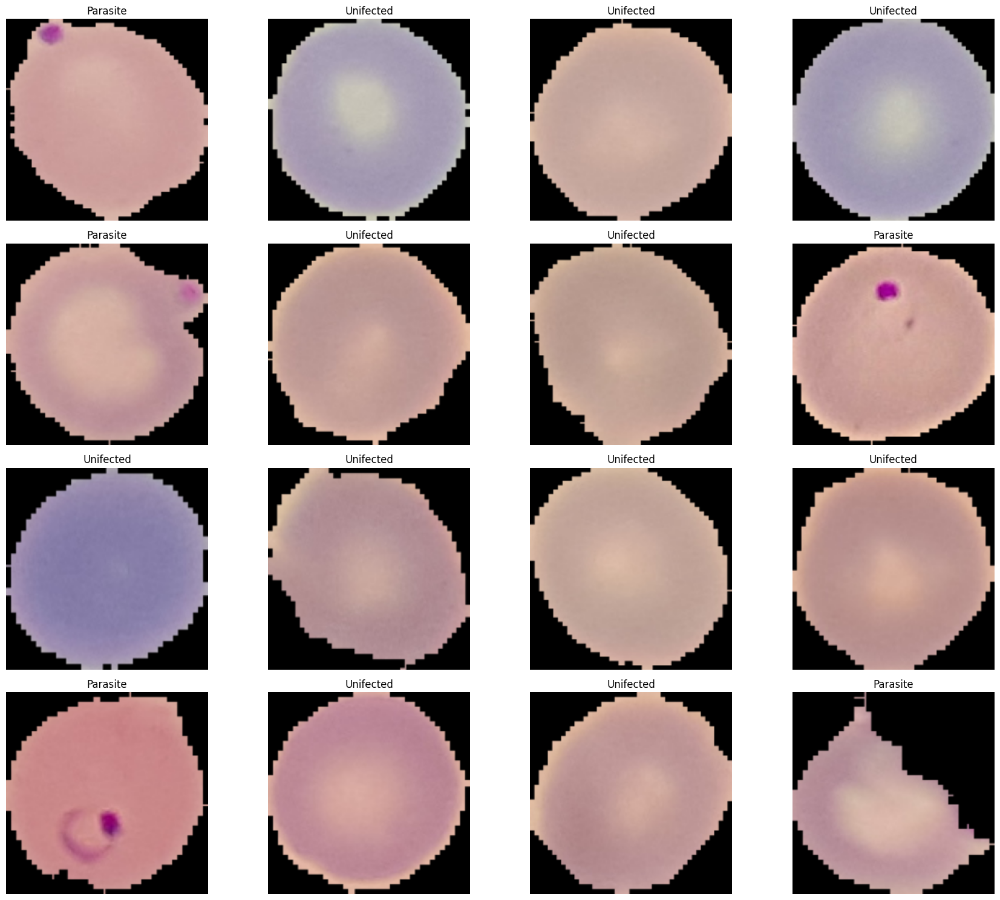

In [ ]:

plt.figure(figsize=(18,15))
for img,lab in ds_train.take(2):
  for i in range(16):
    plt.subplot(4,4,i+1)
    plt.imshow(img[i].numpy().astype("uint32"))
    plt.title(classes[lab[i].numpy()])
    plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
def visualize(img,aug):
  plt.subplot(1,2,1)
  plt.imshow(img[0].numpy().astype("uint32"))
  plt.axis("off")
  plt.subplot(1,2,2)
  plt.imshow(aug[0].numpy().astype("uint32"))
  plt.axis("off")

In [ ]:
def preprocess(img):
  img_data=img
  img_data=tf.image.resize(img_data,(256,256))
  img_data=tf.image.adjust_brightness(img_data,0.4)
  img_data=tf.image.adjust_contrast(img_data,0.4)
  img_data=tf.image.adjust_hue(img_data,0.4)
  return img_data




In [ ]:
gen_train=gen_train.map(preprocess)

AttributeError: 'DirectoryIterator' object has no attribute 'map'

In [ ]:
ds_train.map(preprocess)

In [ ]:
ds_smaple=ds_train
ds_smaple.map(lambda x,y:(preprocess(x),y))

<_MapDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

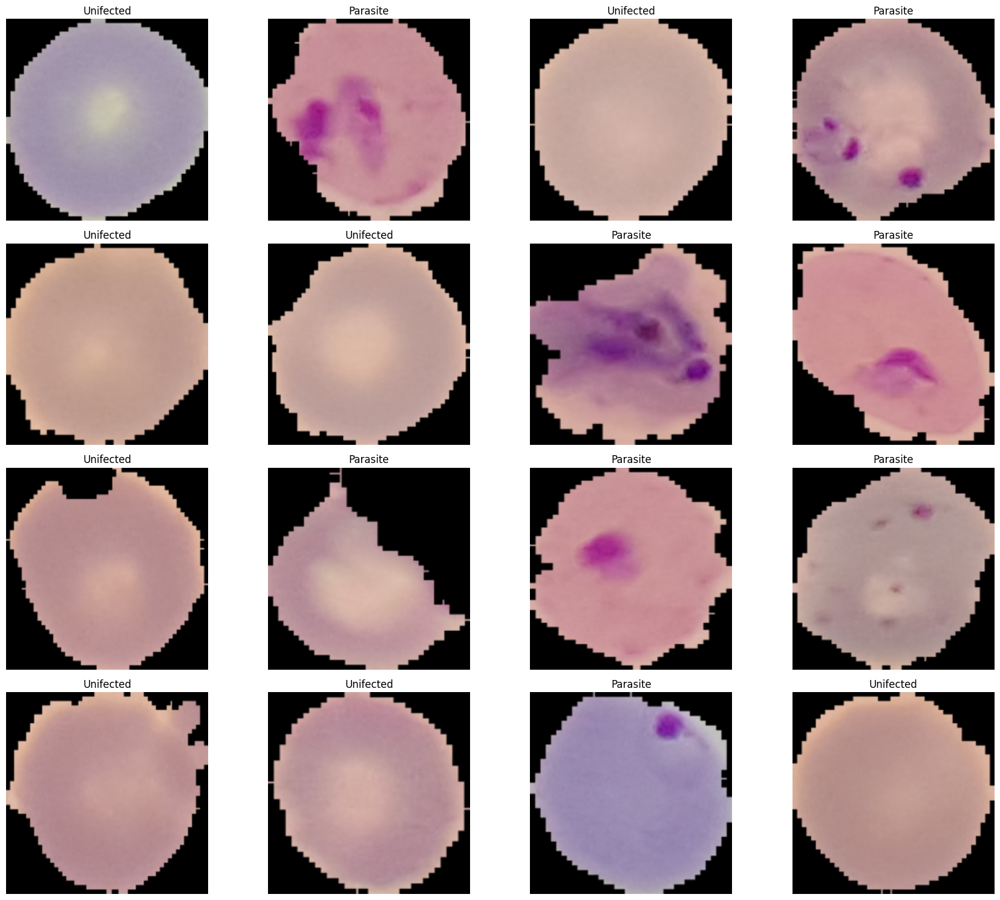

In [ ]:

plt.figure(figsize=(18,15))
for img,lab in ds_smaple.take(2):
  for i in range(16):
    plt.subplot(4,4,i+1)
    plt.imshow(img[i].numpy().astype("uint32"))
    plt.title(classes[lab[i].numpy()])
    plt.axis("off")
plt.tight_layout()
plt.show()


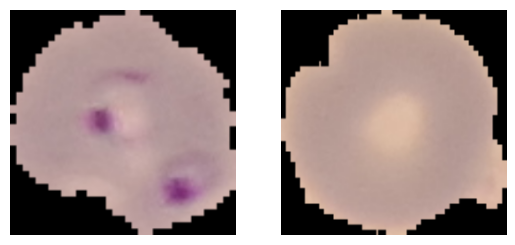

In [ ]:
for (img,label),(imgs,labs) in zip(ds_train.as_numpy_iterator(),ds_smaple.as_numpy_iterator()):
  plt.subplot(1,2,1)
  plt.imshow(img[0].astype("uint32"))
  plt.axis("off")
  plt.subplot(1,2,2)
  plt.imshow(imgs[0].astype("uint32"))
  plt.axis("off")



  break

In [ ]:
train_datagen=ImageDataGenerator(

    rescale=1./255,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)
gen_train=train_datagen.flow_from_directory(
   "/content/drive/MyDrive/imgdata/Dataset/Train",
   target_size=(256,256),
    batch_size=32,
    shuffle=True,
    seed=43
)




test_datagen=ImageDataGenerator(
    rotation_range=40,
    rescale=1./255

)
gen_test=test_datagen.flow_from_directory(
    "/content/drive/MyDrive/imgdata/Dataset/Test",
    target_size=(256,256),
    batch_size=32,
    shuffle=True,
    seed=43
)

Found 416 images belonging to 2 classes.
Found 134 images belonging to 2 classes.


In [ ]:
gen

AttributeError: 'DirectoryIterator' object has no attribute 'map'

In [ ]:
# prompt: import RandomFlip,RandomRotation,Resizing



# Create the data augmentation layers
data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal"),  # Add horizontal flip augmentation
    RandomRotation(0.2),  # Add random rotation augmentation
    Resizing(256, 256),  # Resize images to 256x256
])

# Apply data augmentation to the training dataset
augmented_train_dataset = train_datagen.flow(
    ds_train, batch_size=32, shuffle=True
)

# Apply data augmentation to the test dataset
augmented_test_dataset = test_datagen.flow(
    ds_test, batch_size=32, shuffle=True
)


TypeError: float() argument must be a string or a real number, not '_TakeDataset'

In [ ]:

from tensorflow.keras.layers import RandomFlip, RandomRotation, Resizing
augment=tf.keras.Sequential(
    [
        RandomFlip("horizontal"),
        RandomRotation(0.2),
        Resizing(256,256)
    ]
)

# aug_train=train_datagen.flow(
#     ds_train,batch_size=32,shuffle=True,seed=43
# ).map(lambda x,y:(augment(x),y))
# aug_test=test_datagen.flow(
#     ds_test,batch_size=32,shuffle=True,seed=43,

# ).map(lambda x,y:(augment(x),y))

In [ ]:
ds_train=ds_train.map(lambda x,y:(preprocess(x),y))
ds_test=ds_test.map(lambda x,y:(preprocess(x),y))
ds_val=ds_val.map(lambda x,y:(preprocess(x),y))


In [ ]:
img1=ds_test.shuffle(4096).map(lambda x,y:(preprocess(x),y))
img2=ds_test.shuffle(4096).map(lambda x,y:(preprocess(x),y))


In [ ]:
tf.random.uniform(shape=(1,1))[0][0]

<tf.Tensor: shape=(), dtype=float32, numpy=0.47063136>

In [ ]:
%load_ext tensorboard

In [ ]:
tensorboard --logdir="logs"

Reusing TensorBoard on port 6006 (pid 12865), started 0:11:02 ago. (Use '!kill 12865' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
file_writer=tf.summary.create_file_writer("logs/metrics")

In [ ]:
def scheduler(epochs,lr):
  if epochs<=1:
    learning_rate=lr
  else :
    learning_rate=lr*tf.math.exp(-0.1)
    learning_rate=learning_rate.numpy()

  with file_writer.as_default():
    tf.summary.scalar("learning_rate",data=learning_rate,step=epochs)

  return learning_rate




scheduler_callback=tf.keras.callbacks.LearningRateScheduler(scheduler,verbose=1)





NameError: name 'Sequential' is not defined

In [ ]:
# def mixup(x,y):
#   (img1,lab1),(img2,lab2)=x,y
#   lam=tf.random.uniform(shape=(1,1))[0][0]
#   img=x*lam+(1-lam)*y
#   img_=img2*tf.cast(img1,tf.float32)+img1*(1-tf.cast(img2,tf.float32))

#   return img_


In [ ]:
# def box(lamda):
#   xr=tf.cast(tfp.distributions.Uniform(0,256).sample(1)[0],tf.int32)
#   yr=tf.cast(tfp.distributions.Uniform(0,256).sample(1)[0],tf.int32)

#   rw=tf.cast(256*tf.math.sqrt(1-lamda),tf.int32)
#   rh=tf.cast(256*tf.math.sqrt(1-lamda),tf.int32)

#   xr=tf.clip_by_value(xr-rw//2,0,255)
#   yr=tf.clip_by_value(yr-rh//2,0,255)

#   rx_t=tf.clip_by_value(xr+rw//2,0,255)
#   ry_t=tf.clip_by_value(yr+rh//2,0,255)

#   rw=rx_t-xr
#   # if rw==0:
#     rw=1
#   rh=ry_t-yr
#   if rh==0:
#     rh=1

#   return xr,yr,rw,rh

In [ ]:
# def cutmix(train_img1,train_img2):

#   (img1,lab1),(img2,lab2)=train_img1,train_img2
#   lam=tfp.distributions.Beta(0.3,0.3).sample(1)[0]
#   rx,ry,rw,rh=box(lam)
#   crp_img1=tf.image.crop_to_bounding_box(img1,ry,rx,rh,rw)
#   pad_img1=tf.image.pad_to_bounding_box(crp_img1,rx,ry,256,256)

#   crp_img2=tf.image.crop_to_bounding_box(img2,ry,rx,rh,rw)
#   pad_img2=tf.image.pad_to_bounding_box(crp_img2,rx,ry,256,256)
#   image=img1-pad_img1+pad_img2

#   lamda=tf.cast(1-((rw*rh)/(256*256)),tf.float32)

#   label=lamda*lab1+(1-lamda)*lab2
#   return image,label



# def box(lam):
#   rx=tf.cast(tfp.distributions.Uniform(0,256).sample(1)[0],tf.int32)
#   ry=tf.cast(tfp.distributions.Uniform(0,256).sample(1)[0],tf.int32)

#   rw=tf.cast(256*tf.math.sqrt(1-lam),tf.int32)
#   rh=tf.cast(256*tf.math.sqrt(1-lam),tf.int32)

#   rx=tf.clip_by_value(rx-rw//2,0,255)
#   ry=tf.clip_by_value(ry-rh//2,0,255)

#   rx_t=tf.clip_by_value(rx+rw//2,0,255)
#   ry_t=tf.clip_by_value(ry+rh//2,0,255)

#   rw=rx_t-rx
#   if rw==0:
#     rw=1
#   rh=ry_t-ry
#   if rh==0:
#     rh=1


#   return rx,ry,rw,rh


In [ ]:
# def cutmix(image1,image2):
#   img1,lab1=image1
#   img2,lab2=image2
#   lam=tfp.distributions.Beta(0.3,0.3).sample(1)[0]
#   xr,yr,rw,rh=box(lam)
#   img1=tf.image.crop_to_bounding_box(img1,yr,xr,rh,rw)
#   pad1=tf.image.pad_to_bounding_box(img1,yr,xr,256,256)
#   img2=tf.image.crop_to_bounding_box(img2,yr,xr,rh,rw)
#   pad2=tf.image.pad_to_bounding_box(img2,yr,xr,256,256)
#   img=img1-pad1+pad2
#   lamda=tf.cast(1-((xr*yr)/(256*256)),tf.float32)
#   lab=lamda*lab1+(1-lamda)*lab2
#   return img,lab

In [ ]:
# ds_sam1=ds_train
# ds_sam2=ds_train

# ds_data=tf.data.Dataset.zip((ds_sam1,ds_sam2))
# ds_d=ds_data.map(cutmix,num_parallel_calls=tf.data.AUTOTUNE)


TypeError: in user code:

    File "<ipython-input-35-4a08c3a09d58>", line 15, in cutmix  *
        label=lamda*lab1+(1-lamda)*lab2

    TypeError: Input 'y' of 'Mul' Op has type int32 that does not match type float32 of argument 'x'.


In [ ]:
def aug1(img):
  img=tf.image.adjust_brightness(img,0.4)
  return img
def aug2(img):
  img=tf.image.adjust_contrast(img,0.8)
  return img
def aug3(img):
  img=tf.image.adjust_hue(img,0.6)
  return img
def aug4(img):
  img=tf.image.adjust_saturation(img,0.6)
  return img


ds_tr1=ds_train.shuffle(1024).map(lambda x,y:(aug1(x),y))
ds_tr2=ds_train.shuffle(1024).map(lambda x,y:(aug2(x),y))
ds_tr3=ds_train.shuffle(1024).map(lambda x,y:(aug3(x),y))
ds_tr4=ds_train.shuffle(1024).map(lambda x,y:(aug4(x),y))

full_data=ds_tr1.concatenate(ds_tr1).concatenate(ds_tr2).concatenate(ds_tr3).concatenate(ds_tr4)
full_data

<_ConcatenateDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
ds_train.map(lambda x,y:(augment(x),y))

TypeError: in user code:


    TypeError: outer_factory.<locals>.inner_factory.<locals>.<lambda>() takes 2 positional arguments but 3 were given


In [ ]:
ds_train=ds_train.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
ds_test=ds_test.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
ds_val=ds_val.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
lenet=tf.keras.Sequential()

lenet.add(Conv2D(6,(5,5),input_shape=(256,256,3),activation="relu",padding="same"))
lenet.add(BatchNormalization()),
lenet.add(MaxPool2D(pool_size=(2,2),strides=(2,2),padding="valid"))


lenet.add(Conv2D(16,(5,5),activation="relu",padding="same"))
lenet.add(BatchNormalization()),
lenet.add(MaxPool2D(pool_size=(2,2),strides=(2,2),padding="valid"))

lenet.add(Flatten())
lenet.add(Dense(120,activation="relu"))
lenet.add(Dense(84,activation="relu"))
lenet.add(Dense(2,activation="softmax"))



In [ ]:

metrics = [TruePositives(name='tp'),FalsePositives(name='fp'), TrueNegatives(name='tn'), FalseNegatives(name='fn'),
            BinaryAccuracy(name='accuracy'), Precision(name='precision'), Recall(name='recall'), AUC(name='auc')]


lenet.compile(optimizer = Adam(learning_rate =0.001),
      loss = BinaryCrossentropy(),
      metrics = metrics)

In [ ]:
lenet.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 6)       456       
                                                                 
 batch_normalization (Batch  (None, 256, 256, 6)       24        
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 6)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 16)      2416      
                                                                 
 batch_normalization_1 (Bat  (None, 128, 128, 16)      64        
 chNormalization)                                                
                                                        

In [ ]:
lenet.save("lenet.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:

callbacks = [
    CSVLogger("training_log.csv"),
    EarlyStopping(monitor="val_loss", patience=4, mode="min"),

    ModelCheckpoint(
        filepath="best_model.h5",
        monitor="val_accuracy",
        save_best_only=True,
        save_weights_only=True,
    ),
    ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=2, min_lr=1e-6),
]


In [ ]:
def custom_loss(fact):
  def loss(y_true,y_pred):
    bce=tf.keras.losses.BinaryCrossentropy(from_logits=True)
    return bce(y_true,y_pred)*fact

  return loss


In [ ]:
# prompt: create custom loss function

def custom_loss(fact):
  def loss(y_true,y_pred):
    bce=tf.keras.losses.BinaryCrossentropy(from_logits=True)
    return bce(y_true,y_pred)*fact

  return loss


In [ ]:
lenet.compile(optimizer="Adam",
              loss=custom_loss(0.3),

              metrics=["Accuarcy"]

              )

In [ ]:
hist=lenet.fit(gen_train,epochs=3,validation_data=gen_test,callbacks=[log,scheduler_callback])


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/3


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5818: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


TypeError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1155, in train_step
        return self.compute_metrics(x, y, y_pred, sample_weight)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1249, in compute_metrics
        self.compiled_metrics.update_state(y, y_pred, sample_weight)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/compile_utils.py", line 620, in update_state
        metric_obj.update_state(y_t, y_p, sample_weight=mask)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/metrics_utils.py", line 77, in decorated
        result = update_state_fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/base_metric.py", line 140, in update_state_fn
        return ag_update_state(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/metrics/base_metric.py", line 723, in update_state  **
        matches = ag_fn(y_true, y_pred, **self._fn_kwargs)

    TypeError: 'str' object is not callable


In [ ]:
score=lenet.evaluate(gen_test)
print("loss :",score[0])
print("accuracy :",score[1])

5/5 [==============================] - 6s 941ms/step - loss: 3.3785 - tp: 43.0000 - fp: 91.0000 - tn: 43.0000 - fn: 91.0000 - accuracy: 0.3209 - precision: 0.3209 - recall: 0.3209 - auc: 0.3057
loss : 3.3785247802734375
accuracy : 43.0


In [ ]:
hist.history

{'loss': [1.592810869216919,
  1.111057996749878,
  0.8346928954124451,
  0.6943420767784119,
  0.710378885269165,
  0.5663480162620544],
 'tp': [250.0, 226.0, 283.0, 292.0, 277.0, 319.0],
 'fp': [166.0, 190.0, 133.0, 124.0, 139.0, 97.0],
 'tn': [250.0, 226.0, 283.0, 292.0, 277.0, 319.0],
 'fn': [166.0, 190.0, 133.0, 124.0, 139.0, 97.0],
 'accuracy': [0.6009615659713745,
  0.5432692170143127,
  0.6802884340286255,
  0.7019230723381042,
  0.6658653616905212,
  0.7668269276618958],
 'precision': [0.6009615659713745,
  0.5432692170143127,
  0.6802884340286255,
  0.7019230723381042,
  0.6658653616905212,
  0.7668269276618958],
 'recall': [0.6009615659713745,
  0.5432692170143127,
  0.6802884340286255,
  0.7019230723381042,
  0.6658653616905212,
  0.7668269276618958],
 'auc': [0.6345922350883484,
  0.5585561394691467,
  0.7297349572181702,
  0.7793257832527161,
  0.7662000060081482,
  0.8297718167304993],
 'val_loss': [1.0613703727722168,
  0.7094217538833618,
  1.5162501335144043,
  1.2820

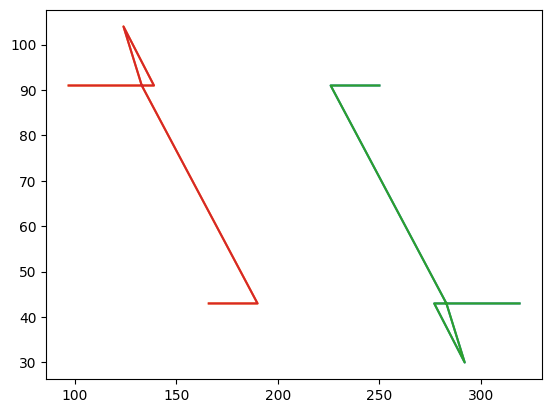

In [ ]:
plt.plot(hist.history['tp'],hist.history['val_tp'],label="model_tp")
plt.plot(hist.history['fp'],hist.history['val_fp'],label="model_fp")


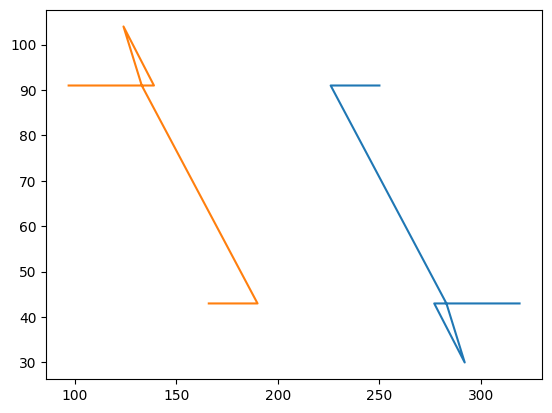

In [ ]:
plt.plot(hist.history['tn'],hist.history['val_tn'],label="model_tn")
plt.plot(hist.history['fn'],hist.history['val_fn'],label="model_fn")

Text(0.5, 1.0, 'model_recall')

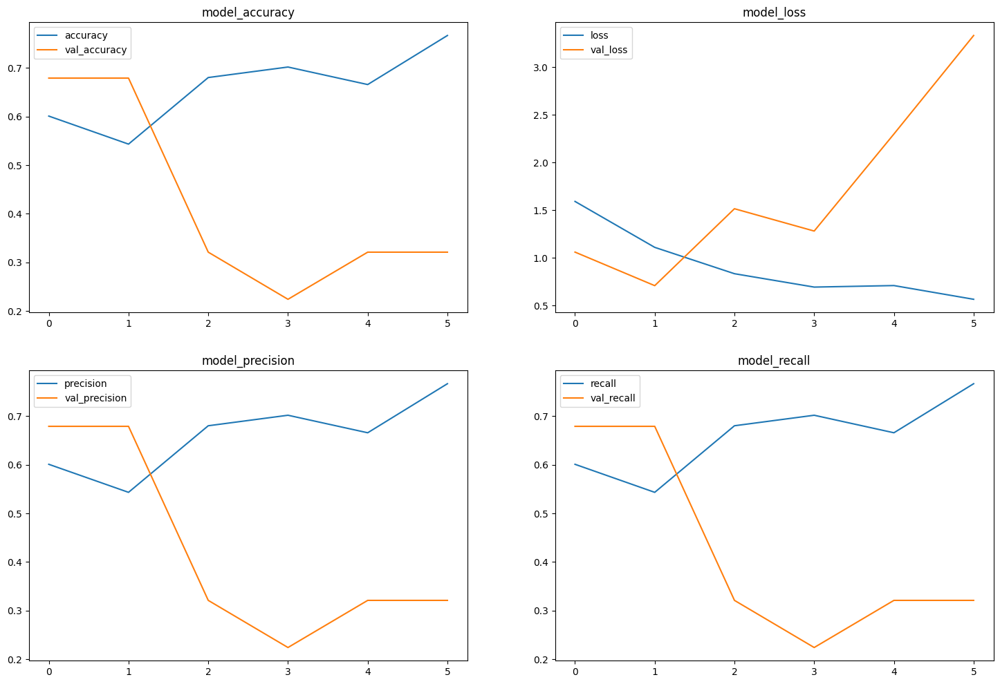

In [ ]:
plt.figure(figsize=(18,12))
plt.subplot(2,2,1)
plt.plot(hist.history['accuracy'],label="accuracy")
plt.plot(hist.history['val_accuracy'],label="val_accuracy")
plt.legend()
plt.title("model_accuracy")
plt.subplot(2,2,2)
plt.plot(hist.history['loss'],label="loss")
plt.plot(hist.history['val_loss'],label="val_loss")
plt.legend()
plt.title("model_loss")
plt.subplot(2,2,3)
plt.plot(hist.history['precision'],label="precision")
plt.plot(hist.history['val_precision'],label="val_precision")
plt.legend()
plt.title("model_precision")
plt.subplot(2,2,4)
plt.plot(hist.history['recall'],label="recall")
plt.plot(hist.history['val_recall'],label="val_recall")
plt.legend()
plt.title("model_recall")

In [ ]:
plt.plot(hist.history['tp'],hist.history['val_tp'],label="model_tp")
plt.plot(hist.history['fp'],hist.history['val_fp'],label="model_fp")
plt.plot(hist.history['tp'],hist.history['val_tp'],label="model_tp")
plt.plot(hist.history['fp'],hist.history['val_fp'],label="model_fp")

Tensor("args_1:0", shape=(None,), dtype=int32)


In [ ]:

ds_train = ds_train.map(lambda x, y: (x, tf.one_hot(y, 2)))
ds_test=ds_test.map(lambda x,y :(x,tf.one_hot(y,2)))
ds_val=ds_val.map(lambda x,y :(x,tf.one_hot(y,2)))

In [ ]:


lenet_mod=tf.keras.Sequential()

lenet_mod.add(Conv2D(6,(5,5),input_shape=(256,256,3),activation="relu",padding="same"))
lenet_mod.add(BatchNormalization()),
lenet_mod.add(MaxPool2D(pool_size=(2,2),strides=(2,2),padding="valid"))


lenet_mod.add(Conv2D(16,(5,5),activation="relu",padding="same"))
lenet_mod.add(BatchNormalization()),
lenet_mod.add(MaxPool2D(pool_size=(2,2),strides=(2,2),padding="valid"))

lenet_mod.add(Flatten())
lenet_mod.add(Dense(120,activation="relu"))
lenet_mod.add(Dense(84,activation="relu"))
lenet_mod.add(Dense(2,activation="softmax"))

lenet_mod.compile(optimizer = Adam(learning_rate =0.001),
      loss = "categorical_crossentropy",
      metrics = metrics)
hist_model=lenet_mod.fit(ds_train,validation_data=ds_test ,epochs=10)

Epoch 1/10
7/7 [==============================] - 23s 3s/step - loss: 7.2006 - tp: 182.0000 - fp: 176.0000 - tn: 139.0000 - fn: 85.0000 - accuracy: 0.5515 - precision: 0.5084 - recall: 0.6816 - auc: 0.5421 - val_loss: 19.4127 - val_tp: 62.0000 - val_fp: 72.0000 - val_tn: 62.0000 - val_fn: 72.0000 - val_accuracy: 0.4627 - val_precision: 0.4627 - val_recall: 0.4627 - val_auc: 0.4603
Epoch 2/10
7/7 [==============================] - 19s 3s/step - loss: 2.7333 - tp: 157.0000 - fp: 67.0000 - tn: 157.0000 - fn: 67.0000 - accuracy: 0.7009 - precision: 0.7009 - recall: 0.7009 - auc: 0.7635 - val_loss: 15.1838 - val_tp: 57.0000 - val_fp: 77.0000 - val_tn: 57.0000 - val_fn: 77.0000 - val_accuracy: 0.4254 - val_precision: 0.4254 - val_recall: 0.4254 - val_auc: 0.4261
Epoch 3/10
7/7 [==============================] - 23s 3s/step - loss: 0.7906 - tp: 194.0000 - fp: 30.0000 - tn: 194.0000 - fn: 30.0000 - accuracy: 0.8661 - precision: 0.8661 - recall: 0.8661 - auc: 0.9202 - val_loss: 13.6615 - val_tp

Text(0.5, 1.0, 'model_recall')

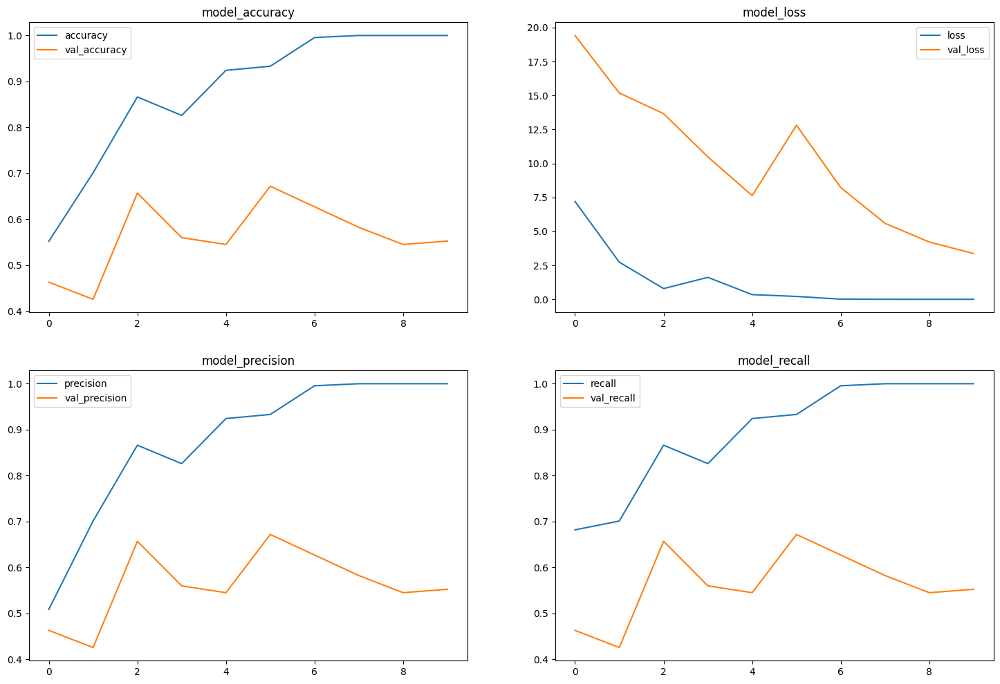

In [ ]:

hist=hist_model
plt.figure(figsize=(18,12))
plt.subplot(2,2,1)
plt.plot(hist.history['accuracy'],label="accuracy")
plt.plot(hist.history['val_accuracy'],label="val_accuracy")
plt.legend()
plt.title("model_accuracy")
plt.subplot(2,2,2)
plt.plot(hist.history['loss'],label="loss")
plt.plot(hist.history['val_loss'],label="val_loss")
plt.legend()
plt.title("model_loss")
plt.subplot(2,2,3)
plt.plot(hist.history['precision'],label="precision")
plt.plot(hist.history['val_precision'],label="val_precision")
plt.legend()
plt.title("model_precision")
plt.subplot(2,2,4)
plt.plot(hist.history['recall'],label="recall")
plt.plot(hist.history['val_recall'],label="val_recall")
plt.legend()
plt.title("model_recall")

In [ ]:
# prompt: create lenet model

lenet=tf.keras.Sequential(
    [
        InputLayer(input_shape=(256,256,3)),
        Conv2D(filters=6,kernel_size=(5,5),strides=(1,1),activation="relu",padding="valid"),
        MaxPool2D(pool_size=(2,2),strides=(2,2),padding="valid"),
        Conv2D(filters=16,kernel_size=(5,5),strides=(1,1),activation="relu",padding="valid"),
        MaxPool2D(pool_size=(2,2),strides=(2,2),padding="valid"),
        Flatten(),
        Dense(units=120,activation="relu"),
        Dense(units=84,activation="relu"),
        Dense(units=2,activation="softmax")
    ]
)
